In [4]:
from glob import glob

import matplotlib.pyplot as plt
import cv2
import numpy as np


def get_video_names(person: str):
    return [dirpath.split('/')[-1] for dirpath in glob(f'{person}_processed/*')]
    

def get_framenums(person: str, video_name: str):
    filepaths = glob(f'{person}_processed/{video_name}/*.png')
    return sorted([int(filepath.split('/')[-1][:-4]) for filepath in filepaths])


persons = ['hyunwoo', 'changmin']
video_names = {person: get_video_names(person) for person in persons}
framenums = {(person, video_name): get_framenums(person, video_name)
    for person in persons for video_name in video_names[person]}


BODY_JOINTS = [
    ('LEFT_WRIST', 'LEFT_ELBOW'),
    ('LEFT_ELBOW', 'LEFT_SHOULDER'),
    ('LEFT_SHOULDER', 'RIGHT_SHOULDER'),
    ('RIGHT_SHOULDER', 'RIGHT_ELBOW'),
    ('RIGHT_ELBOW', 'RIGHT_WRIST'),
    ('LEFT_SHOULDER', 'LEFT_HIP'),
    ('LEFT_HIP', 'RIGHT_HIP'),
    ('RIGHT_HIP', 'RIGHT_SHOULDER'),
    ('LEFT_HIP', 'LEFT_KNEE'),
    ('LEFT_KNEE', 'LEFT_ANKLE'),
    ('RIGHT_HIP', 'RIGHT_KNEE'),
    ('RIGHT_KNEE', 'RIGHT_ANKLE')
]

def get_image(person: str, video_name: str, framenum: int):
    image_path = f'{person}_processed/{video_name}/{framenum}.png'
    img = cv2.imread(image_path)[:,:,[2,1,0]]
    return img

def draw_image(person: str, video_name: str, framenum: int):
    img = get_image(person, video_name, framenum)
    plt.imshow(img)
    body_parts = {}
    out_path = f'{person}_processed/{video_name}/{framenum}.out'
    with open(out_path, 'r') as fp:
        scores = []
        for line in list(fp)[1:]:
            body_part_name, x, y, score = line.strip().split(' ')
            x, y, score = int(x), int(y), float(score)
            body_parts[body_part_name] = (x, y, score)
            plt.scatter(x, y, color='r')
            scores.append(score)

        for joint1, joint2 in BODY_JOINTS:
            x1, y1, score1 = body_parts[joint1]
            x2, y2, score2 = body_parts[joint2]
            plt.plot([x1, x2], [y1, y2], color='r')
    print(f'video_name: {video_name} confidance: {np.average(scores) :.2f}')
    plt.show()


In [5]:
BodyPart = [
    'NOSE',
    'LEFT_EYE',
    'RIGHT_EYE',
    'LEFT_EAR',
    'RIGHT_EAR',
    'LEFT_SHOULDER',
    'RIGHT_SHOULDER',
    'LEFT_ELBOW',
    'RIGHT_ELBOW',
    'LEFT_WRIST',
    'RIGHT_WRIST',
    'LEFT_HIP',
    'RIGHT_HIP',
    'LEFT_KNEE',
    'RIGHT_KNEE',
    'LEFT_ANKLE',
    'RIGHT_ANKLE',
]

In [8]:
import tensorflow as tf
# Load the TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="posenet_model.tflite")
interpreter.allocate_tensors()

# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

input_shape = input_details[0]['shape']

({'NOSE': (31, 96, 0.0007379379),
  'LEFT_EYE': (259, 34, 0.00040532972),
  'RIGHT_EYE': (65, 95, 0.00073527393),
  'LEFT_EAR': (63, 61, 0.0004893165),
  'RIGHT_EAR': (31, 96, 0.0004895514),
  'LEFT_SHOULDER': (39, 85, 0.00086413464),
  'RIGHT_SHOULDER': (29, 82, 0.00083515036),
  'LEFT_ELBOW': (62, 61, 0.0030073766),
  'RIGHT_ELBOW': (67, 61, 0.0027586506),
  'LEFT_WRIST': (59, 62, 0.0041369726),
  'RIGHT_WRIST': (65, 64, 0.0037323995),
  'LEFT_HIP': (-2, 61, 0.0042263065),
  'RIGHT_HIP': (72, 62, 0.004011011),
  'LEFT_KNEE': (65, 65, 0.008551896),
  'RIGHT_KNEE': (32, 68, 0.0023508822),
  'LEFT_ANKLE': (33, 227, 0.0023751594),
  'RIGHT_ANKLE': (66, 226, 0.0034171767)},
 0.0025367367)

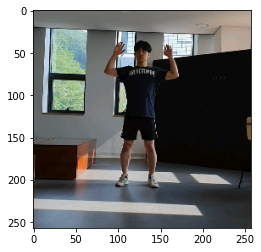

In [39]:
from scipy.special import expit as sigmoid
from scipy.ndimage import rotate
import numpy as np


def inference(img):
    img = (img - 128) / 128
    plt.imshow(img)
    # Test the model on random input data.
    input_data = np.array(img, dtype=np.float32)
    interpreter.set_tensor(input_details[0]['index'], input_data.reshape(input_shape))

    interpreter.invoke()

    # The function `get_tensor()` returns a copy of the tensor data.
    # Use `tensor()` in order to get a pointer to the tensor.
    heatmaps = interpreter.get_tensor(output_details[0]['index'])
    offsets = interpreter.get_tensor(output_details[1]['index'])

    height = heatmaps[0].shape[0]
    width = heatmaps[0][0].shape[0]
    numKeypoints = heatmaps[0][0][0].shape[0]

    keypointPositions = []
    for keypoint in range(numKeypoints):
        maxVal = heatmaps[0][0][0][keypoint]
        maxRow = 0
        maxCol = 0
        for row in range(height):
            for col in range(width):
                if heatmaps[0][row][col][keypoint] > maxVal:
                    maxVal = heatmaps[0][row][col][keypoint]
                    maxRow = row
                    maxCol = col
        keypointPositions.append((maxRow, maxCol))

    result = {}
    for i, (positionY, positionX) in enumerate(keypointPositions):
        yCoord = int(positionY / (height - 1) * img.shape[0] + offsets[0][positionY][positionX][i])
        xCoord = int(positionX / (width - 1) * img.shape[1] + offsets[0][positionY][positionX][i + numKeypoints])
        confidenceScore = sigmoid(heatmaps[0][positionY][positionX][i])

        result[BodyPart[i]] = (xCoord, yCoord, confidenceScore)

    avg_score = np.average([r[2] for r in result.values()])
    return result, avg_score

img = get_image('hyunwoo', 'both_side_arm', 0)
inference(img)

In [ ]:
plt.imshow(img)

video_name: regular confidance: 0.61


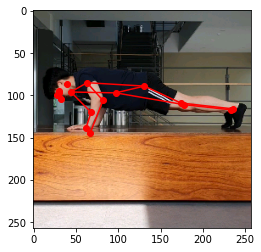

video_name: regular confidance: 0.61


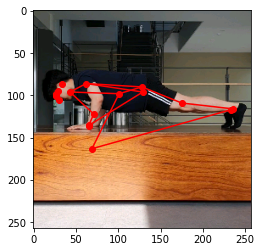

video_name: regular confidance: 0.63


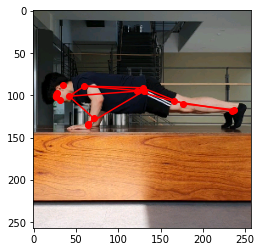

video_name: regular confidance: 0.56


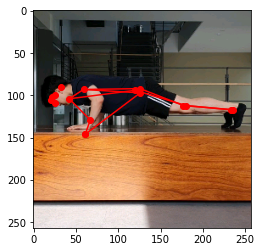

video_name: regular confidance: 0.56


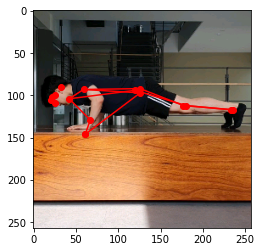

video_name: regular confidance: 0.58


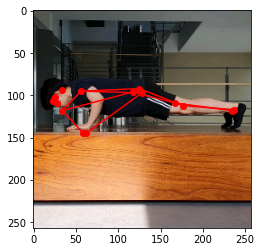

video_name: regular confidance: 0.59


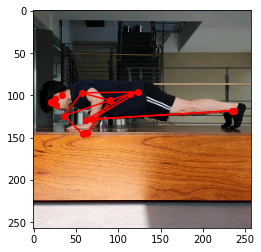

video_name: regular confidance: 0.58


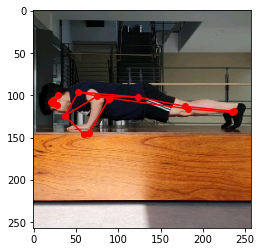

video_name: regular confidance: 0.55


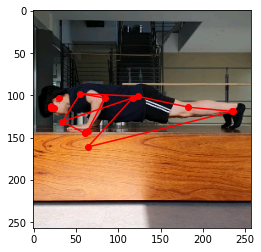

video_name: regular confidance: 0.58


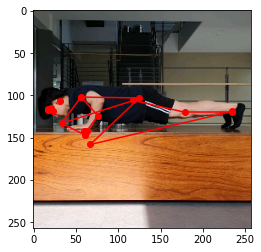

video_name: table confidance: 0.66


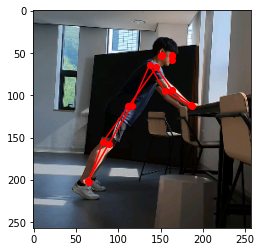

video_name: table confidance: 0.70


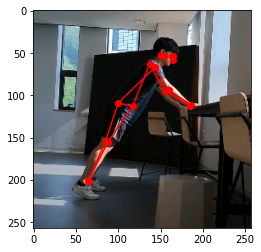

video_name: table confidance: 0.68


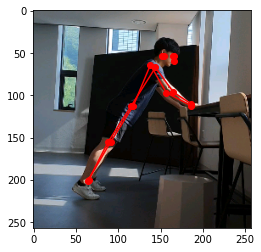

video_name: table confidance: 0.68


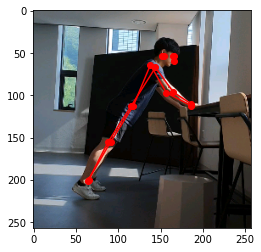

video_name: table confidance: 0.69


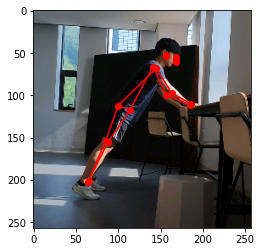

video_name: table confidance: 0.72


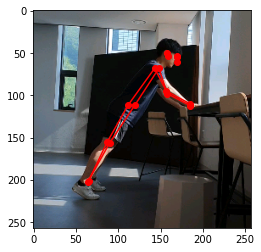

video_name: table confidance: 0.73


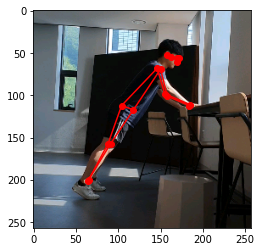

video_name: table confidance: 0.70


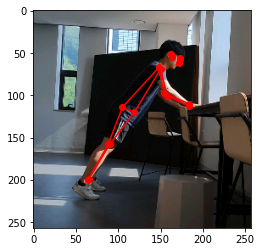

video_name: table confidance: 0.68


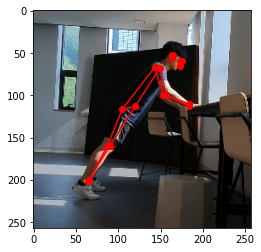

video_name: table confidance: 0.70


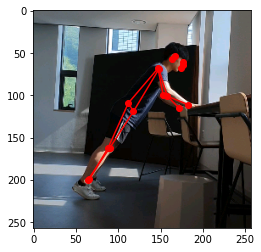

video_name: false_medium confidance: 0.55


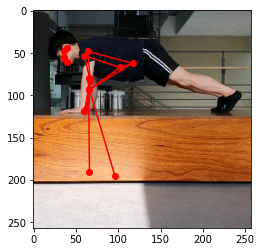

video_name: false_medium confidance: 0.54


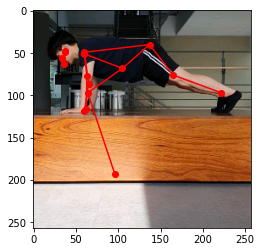

video_name: false_medium confidance: 0.54


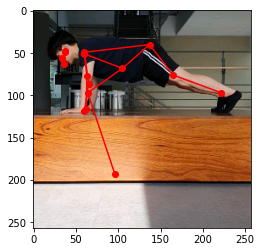

video_name: false_medium confidance: 0.57


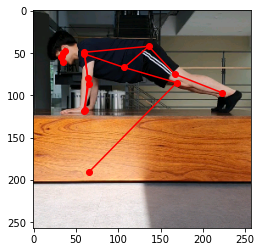

video_name: false_medium confidance: 0.52


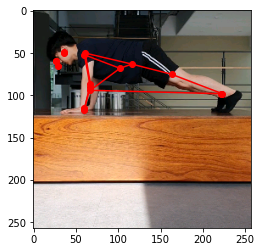

video_name: false_medium confidance: 0.56


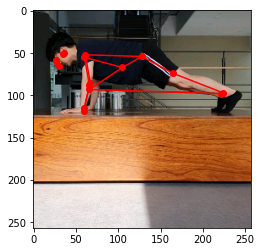

video_name: false_medium confidance: 0.55


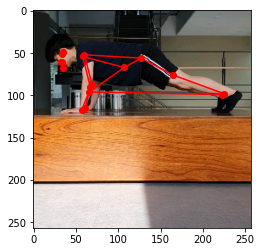

video_name: false_medium confidance: 0.54


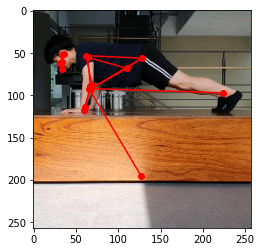

video_name: false_medium confidance: 0.55


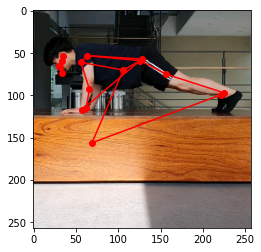

video_name: false_medium confidance: 0.55


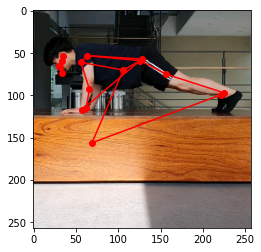

video_name: frontal_view confidance: 0.40


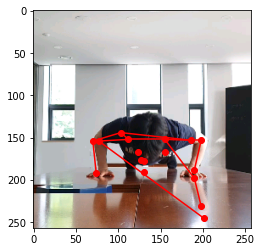

video_name: frontal_view confidance: 0.35


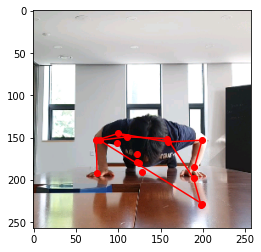

video_name: frontal_view confidance: 0.35


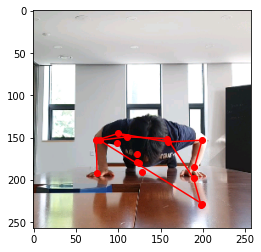

video_name: frontal_view confidance: 0.36


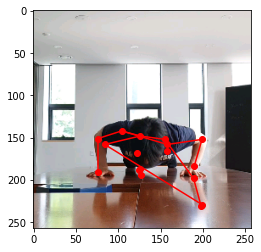

video_name: frontal_view confidance: 0.33


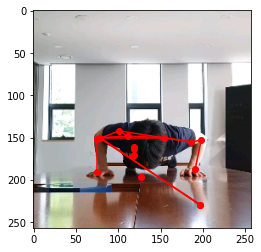

video_name: frontal_view confidance: 0.28


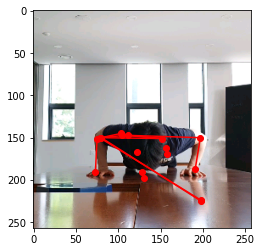

video_name: frontal_view confidance: 0.30


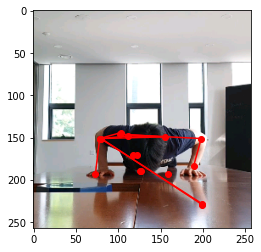

video_name: frontal_view confidance: 0.30


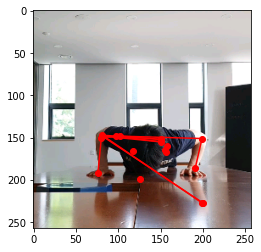

video_name: frontal_view confidance: 0.29


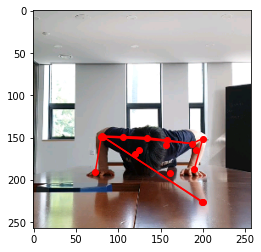

video_name: frontal_view confidance: 0.29


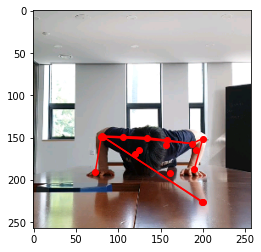

video_name: false_laying_on_floor confidance: 0.65


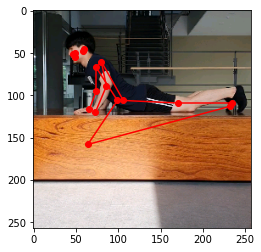

video_name: false_laying_on_floor confidance: 0.65


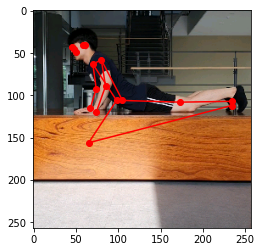

video_name: false_laying_on_floor confidance: 0.65


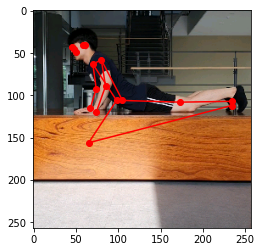

video_name: false_laying_on_floor confidance: 0.64


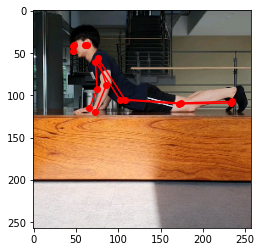

video_name: false_laying_on_floor confidance: 0.62


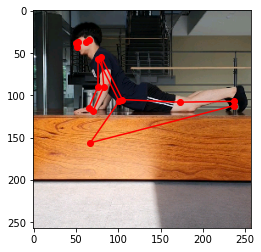

video_name: false_laying_on_floor confidance: 0.65


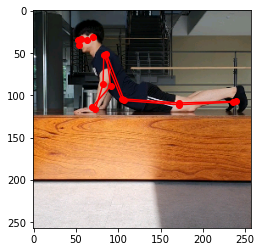

video_name: false_laying_on_floor confidance: 0.64


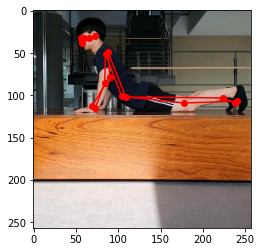

video_name: false_laying_on_floor confidance: 0.64


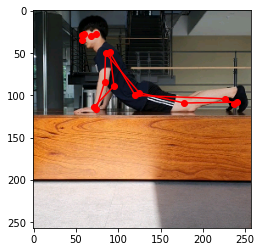

video_name: false_laying_on_floor confidance: 0.62


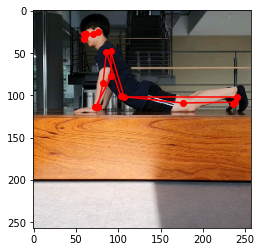

video_name: false_laying_on_floor confidance: 0.62


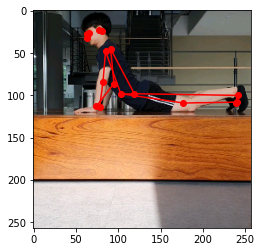

video_name: both_side_arm confidance: 0.93


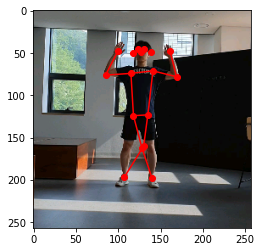

video_name: both_side_arm confidance: 0.93


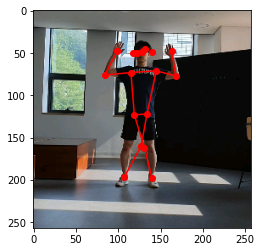

video_name: both_side_arm confidance: 0.93


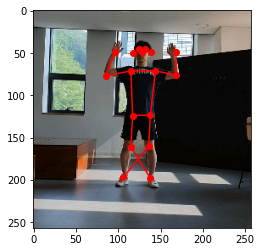

video_name: both_side_arm confidance: 0.93


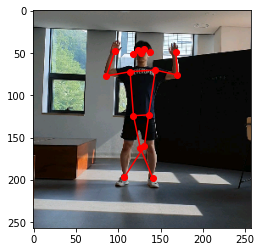

video_name: both_side_arm confidance: 0.93


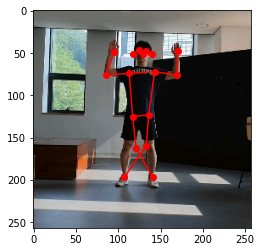

video_name: both_side_arm confidance: 0.93


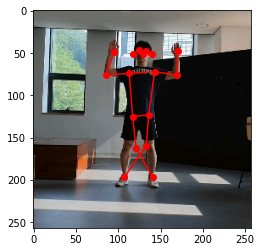

video_name: both_side_arm confidance: 0.94


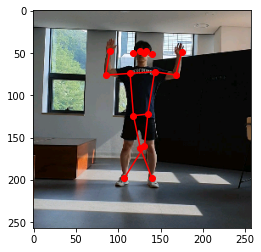

video_name: both_side_arm confidance: 0.94


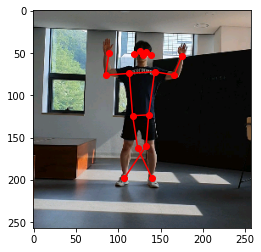

video_name: both_side_arm confidance: 0.94


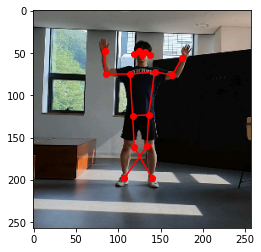

video_name: both_side_arm confidance: 0.94


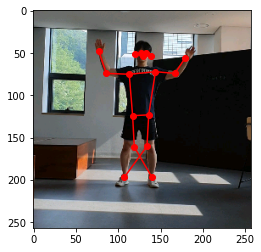

video_name: degree_45_wide confidance: 0.76


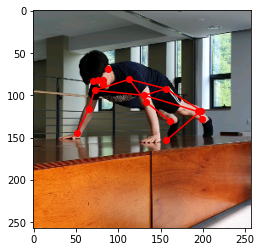

video_name: degree_45_wide confidance: 0.72


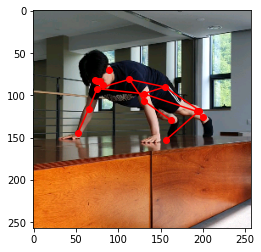

video_name: degree_45_wide confidance: 0.72


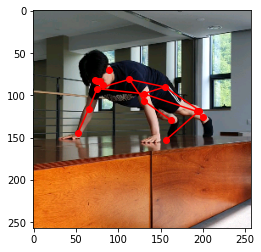

video_name: degree_45_wide confidance: 0.72


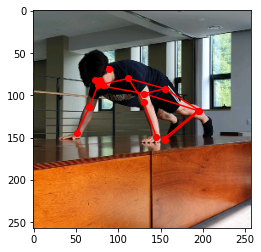

video_name: degree_45_wide confidance: 0.73


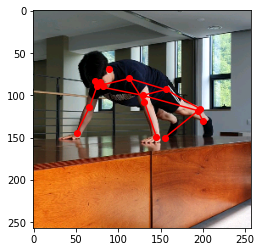

video_name: degree_45_wide confidance: 0.73


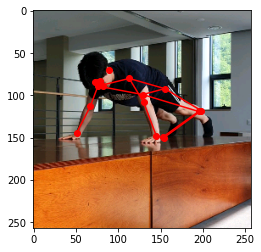

video_name: degree_45_wide confidance: 0.74


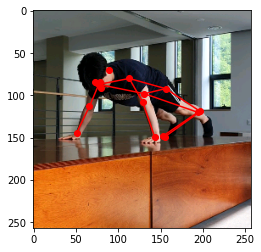

video_name: degree_45_wide confidance: 0.74


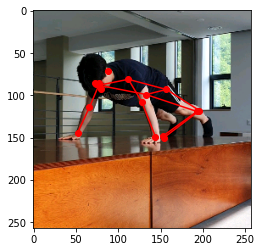

video_name: degree_45_wide confidance: 0.73


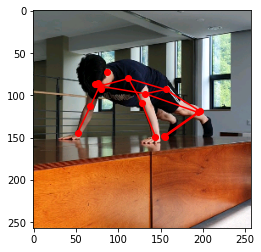

video_name: degree_45_wide confidance: 0.75


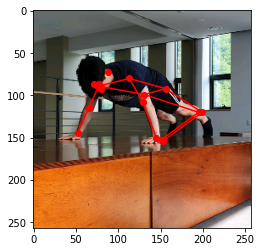

video_name: false_small confidance: 0.44


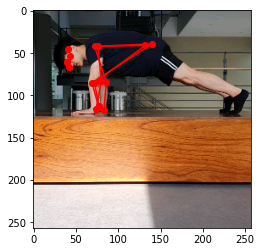

video_name: false_small confidance: 0.44


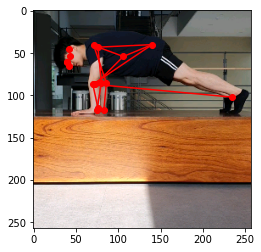

video_name: false_small confidance: 0.45


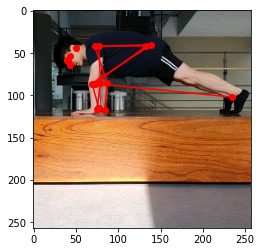

video_name: false_small confidance: 0.45


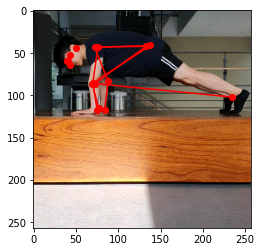

video_name: false_small confidance: 0.45


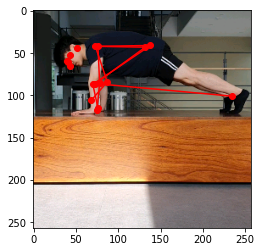

video_name: false_small confidance: 0.45


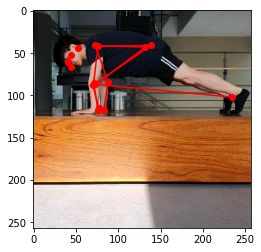

video_name: false_small confidance: 0.45


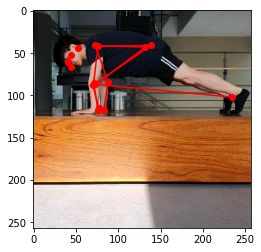

video_name: false_small confidance: 0.44


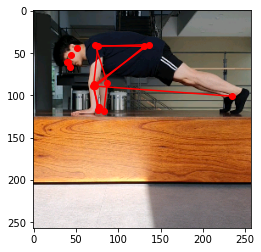

video_name: false_small confidance: 0.44


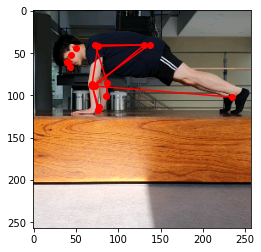

video_name: false_small confidance: 0.43


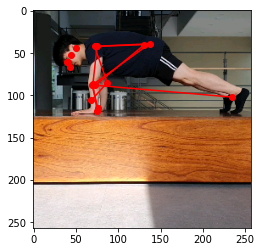

video_name: rear_view confidance: 0.50


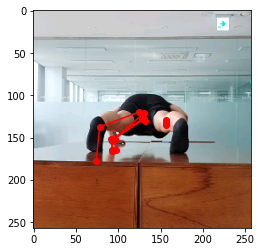

video_name: rear_view confidance: 0.46


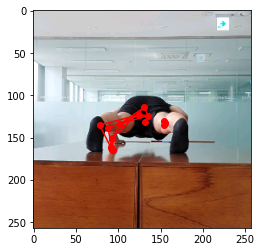

video_name: rear_view confidance: 0.45


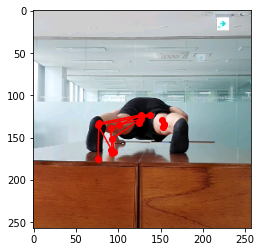

video_name: rear_view confidance: 0.46


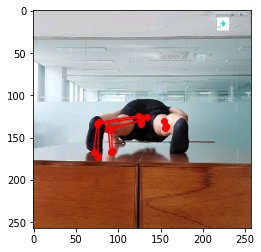

video_name: rear_view confidance: 0.46


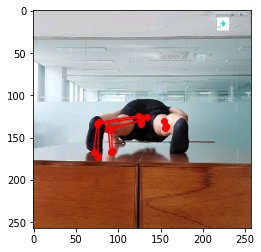

video_name: rear_view confidance: 0.45


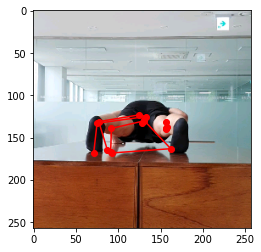

video_name: rear_view confidance: 0.49


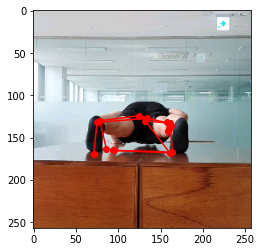

video_name: rear_view confidance: 0.44


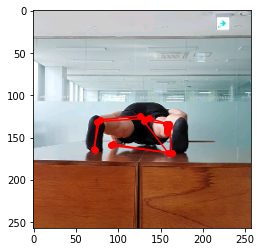

video_name: rear_view confidance: 0.52


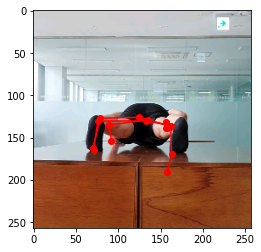

video_name: rear_view confidance: 0.51


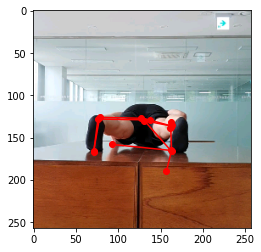

video_name: false_wall confidance: 0.77


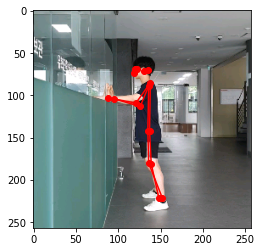

video_name: false_wall confidance: 0.77


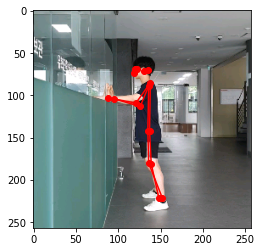

video_name: false_wall confidance: 0.76


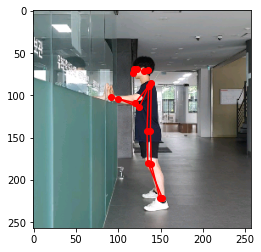

video_name: false_wall confidance: 0.75


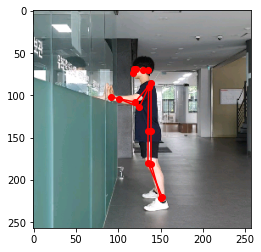

video_name: false_wall confidance: 0.76


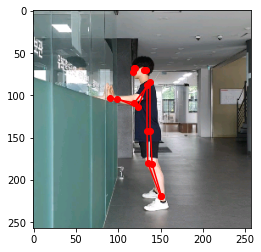

video_name: false_wall confidance: 0.76


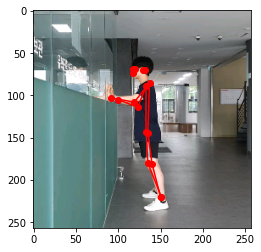

video_name: false_wall confidance: 0.75


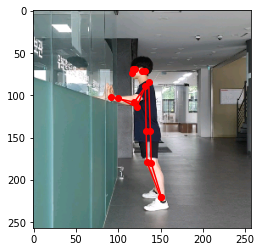

video_name: false_wall confidance: 0.75


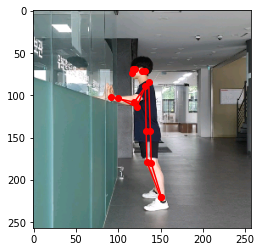

video_name: false_wall confidance: 0.76


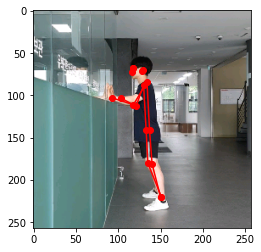

video_name: false_wall confidance: 0.77


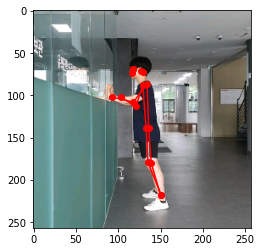

video_name: false_form confidance: 0.53


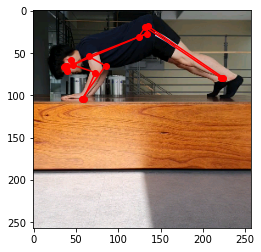

video_name: false_form confidance: 0.53


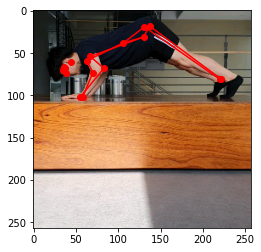

video_name: false_form confidance: 0.53


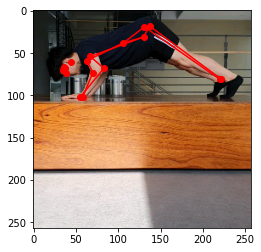

video_name: false_form confidance: 0.50


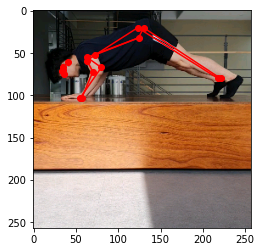

video_name: false_form confidance: 0.60


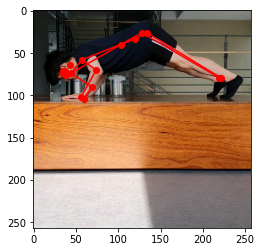

video_name: false_form confidance: 0.57


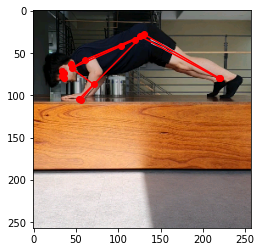

video_name: false_form confidance: 0.58


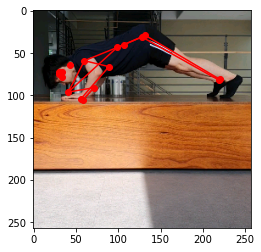

video_name: false_form confidance: 0.57


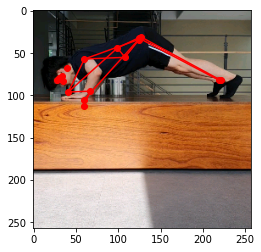

video_name: false_form confidance: 0.58


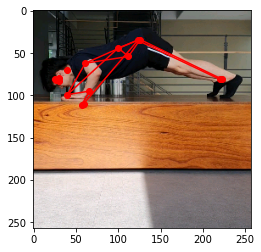

video_name: false_form confidance: 0.52


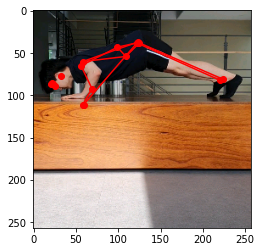

video_name: degree_45_narrow confidance: 0.78


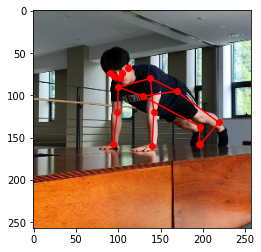

video_name: degree_45_narrow confidance: 0.78


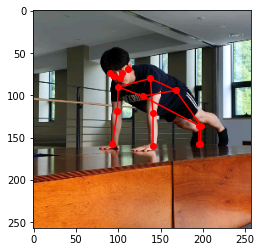

video_name: degree_45_narrow confidance: 0.78


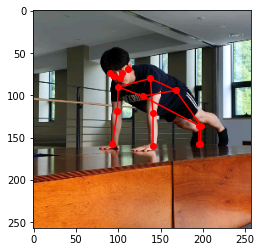

video_name: degree_45_narrow confidance: 0.78


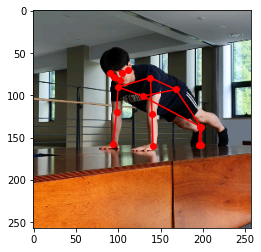

video_name: degree_45_narrow confidance: 0.78


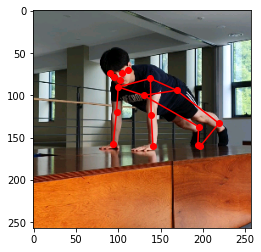

video_name: degree_45_narrow confidance: 0.76


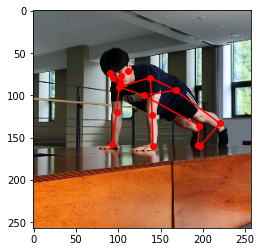

video_name: degree_45_narrow confidance: 0.76


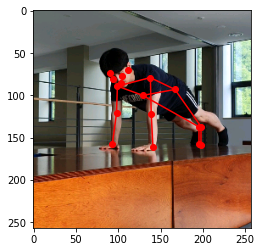

video_name: degree_45_narrow confidance: 0.76


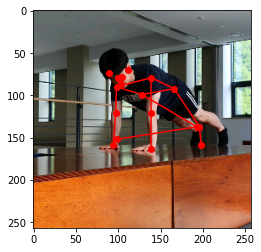

video_name: degree_45_narrow confidance: 0.76


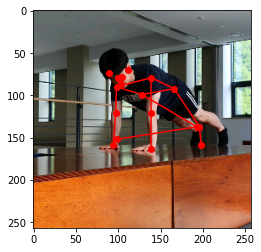

video_name: degree_45_narrow confidance: 0.75


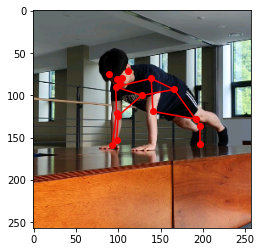

video_name: left_side_arm confidance: 0.92


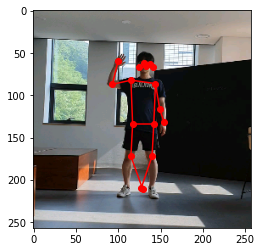

video_name: left_side_arm confidance: 0.92


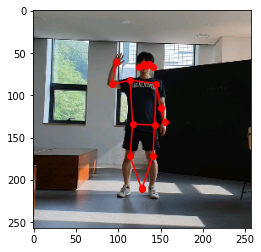

video_name: left_side_arm confidance: 0.92


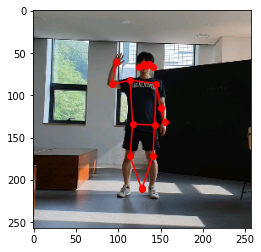

video_name: left_side_arm confidance: 0.92


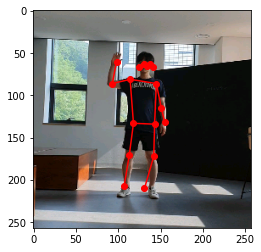

video_name: left_side_arm confidance: 0.92


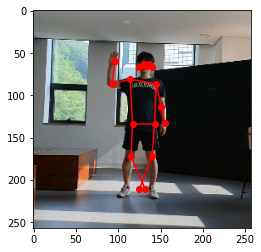

video_name: left_side_arm confidance: 0.92


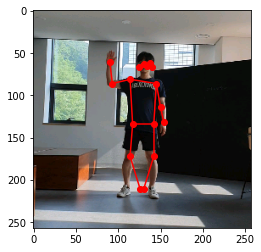

video_name: left_side_arm confidance: 0.93


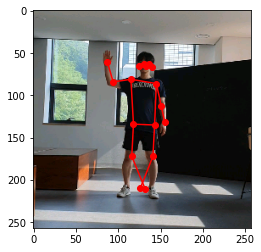

video_name: left_side_arm confidance: 0.93


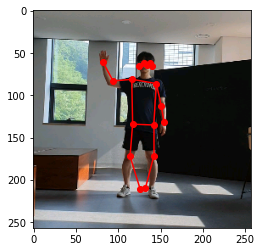

video_name: left_side_arm confidance: 0.93


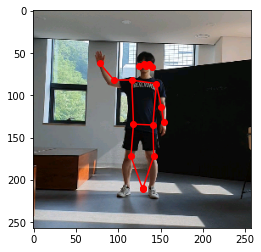

video_name: left_side_arm confidance: 0.93


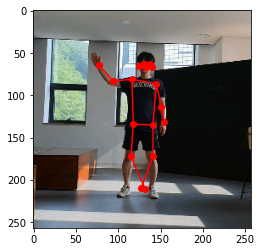

video_name: false_knee_on_bottom confidance: 0.63


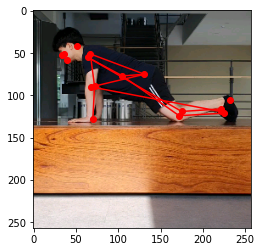

video_name: false_knee_on_bottom confidance: 0.64


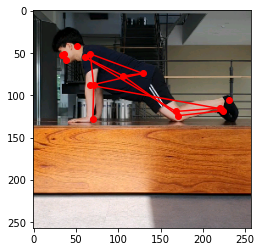

video_name: false_knee_on_bottom confidance: 0.64


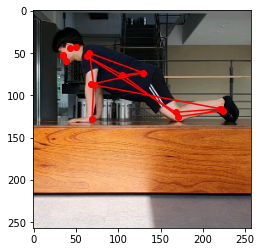

video_name: false_knee_on_bottom confidance: 0.64


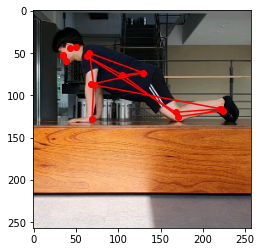

video_name: false_knee_on_bottom confidance: 0.65


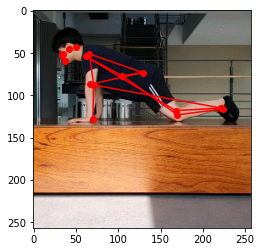

video_name: false_knee_on_bottom confidance: 0.61


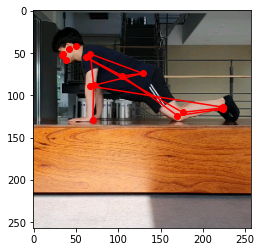

video_name: false_knee_on_bottom confidance: 0.59


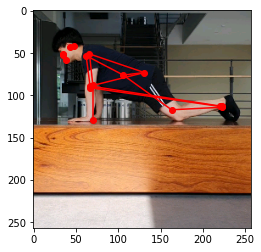

video_name: false_knee_on_bottom confidance: 0.60


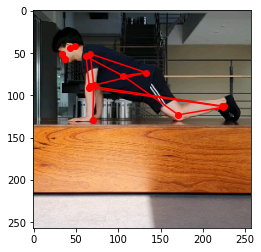

video_name: false_knee_on_bottom confidance: 0.59


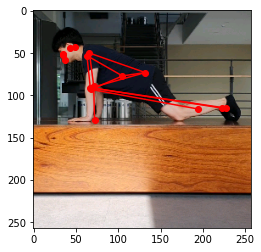

video_name: false_knee_on_bottom confidance: 0.61


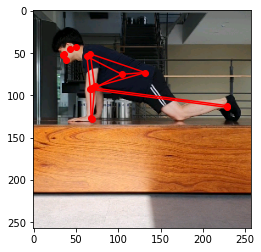

In [24]:
person = 'hyunwoo'
for video_name in get_video_names(person):
    for framenum in get_framenums(person, video_name)[:10]:
        draw_image(person, video_name, framenum)